## 1. Import Libraries

In [94]:
# Data manipulation
import numpy as np
import pandas as pd
from astral.sun import sun
from astral import LocationInfo
from skforecast.datasets import fetch_dataset

#Data requests
import requests
from datetime import date, timedelta
import openmeteo_requests
import requests_cache
from retry_requests import retry
import os

# Plotting
import matplotlib.pyplot as plt
from statsmodels.graphics.tsaplots import plot_acf
from statsmodels.graphics.tsaplots import plot_pacf
import plotly.graph_objects as go
import plotly.io as pio
import plotly.offline as poff
pio.renderers.default = 'notebook' 
pio.templates.default = "seaborn"
poff.init_notebook_mode(connected=True)
plt.style.use('seaborn-v0_8-darkgrid')

# Modelling and Forecasting
from lightgbm import LGBMRegressor
from sklearn.preprocessing import PolynomialFeatures
from sklearn.feature_selection import RFECV
from skforecast.ForecasterBaseline import ForecasterEquivalentDate
from skforecast.ForecasterAutoreg import ForecasterAutoreg
from skforecast.ForecasterAutoregDirect import ForecasterAutoregDirect
from skforecast.model_selection import bayesian_search_forecaster
from skforecast.model_selection import backtesting_forecaster
import shap
shap.initjs()

# Warnings configuration
import warnings
warnings.filterwarnings('once')

## 2. Get Data

In [2]:
MAX_PAGE_SIZE = 5000
years = 6 #Years of Data
end_date = date.today() - timedelta(days=2)
start_date = date.today() - timedelta(days=(365*years)) 
api_key = "" #Enter api.eia.gov api key here

Default values for San Diego subregion. You can find the available subregions here: https://www.eia.gov/opendata/browser/electricity/rto/region-data under respondent

In [3]:
lat_default = 32.71
lon_default = -117.16
subba_default = 'SDGE'
city_default = 'San Diego'
country_default = 'America'
timezone_default = 'America/Los_Angeles'

#### Get electricity data from eia.gov api

In [4]:
def get_electricity_data(subba: str = subba_default) -> pd.DataFrame:
    offset = 0
    api_url = f"https://api.eia.gov/v2/electricity/rto/region-sub-ba-data/data/?frequency=hourly&data[0]=value&facets[subba][]={subba}&sort[0][column]=period&sort[0][direction]=asc&api_key={api_key}"
    records = []
    
    while True:
        params = {
            'offset': offset,
            'length': MAX_PAGE_SIZE,
            'end': f'{start_date}T00',
            'end': f'{end_date}T00'
        }

        response = requests.get(api_url, params=params)

        if response.status_code == 200:
            json_response = response.json()
            new_records = json_response.get('response', {}).get('data', [])
            
            records.extend(new_records)
            
            # Check if we have received the last page
            if len(new_records) < MAX_PAGE_SIZE:
                break
            
            # Increase offset to get the next page
            offset += MAX_PAGE_SIZE
        else:
            print(f"Failed to fetch data: {response.status_code}")
            break

    # Convert records to dataframe, sort index, and drop null values
    data = pd.DataFrame(records)
    data['period'] = pd.to_datetime(data['period'], format='%Y-%m-%dT%H')
    data['value'] = pd.to_numeric(data['value'])
    data = data[['period', 'value']]
    data.rename(columns = {'period': 'time'}, inplace=True)
    data = data.set_index('time')
    data = data.sort_index()
    data = data.asfreq('1h')
    data = data.dropna()
    return data

#### Get weather data from open-meteo API client

In [5]:
def get_weather_data(lat: int = lat_default, lon: int = lon_default) -> pd.DataFrame:
    # Setup the Open-Meteo API client with cache and retry on error
    cache_session = requests_cache.CachedSession('.cache', expire_after = -1)
    retry_session = retry(cache_session, retries = 5, backoff_factor = 0.2)
    openmeteo = openmeteo_requests.Client(session = retry_session)

    #Parameters
    url = "https://archive-api.open-meteo.com/v1/archive"
    params_weather = {
    "latitude": lat,
    "longitude": lon,
    "start_date": start_date,
    "end_date": end_date,
    "hourly": "temperature_2m"
    }

    responses_weather = openmeteo.weather_api(url, params=params_weather)

    response_weather = responses_weather[0]

    # Process hourly data. The order of variables needs to be the same as requested.
    hourly = response_weather.Hourly()
    hourly_temperature_2m = hourly.Variables(0).ValuesAsNumpy()

    hourly_data = {"date": pd.date_range(
        start = pd.to_datetime(hourly.Time(), unit = "s"),
        end = pd.to_datetime(hourly.TimeEnd(), unit = "s"),
        freq = pd.Timedelta(seconds = hourly.Interval()),
        inclusive = "left"
    )}
    hourly_data["temperature_2m"] = hourly_temperature_2m

    hourly_dataframe = pd.DataFrame(data = hourly_data)
    hourly_dataframe.rename(columns = {'temperature_2m': 'temperature'}, inplace=True)
    hourly_dataframe = hourly_dataframe.set_index('date')
    hourly_dataframe = hourly_dataframe.sort_index()
    hourly_dataframe = hourly_dataframe.asfreq('1h')
    return hourly_dataframe

#### Combine electricity and weather data

In [6]:
def combine_data(energy_data: pd.DataFrame, weather_data: pd.DataFrame) -> pd.DataFrame:
    data = energy_data.join(weather_data, how='left')
    data = data.sort_index()
    data = data.asfreq('1h', method='ffill')
    return data

In [7]:
electricity_data = get_electricity_data(subba_default)
weather_data = get_weather_data()
data = combine_data(electricity_data, weather_data)

In [97]:
if not os.path.exists('Data'):
    os.makedirs('Data')

In [98]:
data.to_csv(f'Data/demand_data_{subba_default}_{end_date}.csv')

#### Verify complete data

In [10]:
(data.index == pd.date_range(start=data.index.min(),
                             end=data.index.max(),
                             freq=data.index.freq)).all()

print(f"Number of rows with missing values: {data.isnull().any(axis=1).mean()}")

Number of rows with missing values: 0.0


#### Create exogenous variables

Code taken and modified from: https://www.cienciadedatos.net/documentos/py29-forecasting-electricity-power-demand-python.html

In [8]:
# Calendar features
calendar_features = pd.DataFrame(index=data.index)
calendar_features['month'] = calendar_features.index.month
calendar_features['week_of_year'] = calendar_features.index.isocalendar().week
calendar_features['week_day'] = calendar_features.index.day_of_week + 1
calendar_features['hour_day'] = calendar_features.index.hour + 1

location = LocationInfo(
    city_default,
    country_default,
    latitude=lat_default,
    longitude=lon_default,
    timezone=timezone_default
)
# Prepare the sunlight features
sunrise_hour = []
sunset_hour = []
for date in data.index:
    try:
        sunrise = sun(location.observer, date, tzinfo=location.timezone)['sunrise'].hour
        sunset = sun(location.observer, date, tzinfo=location.timezone)['sunset'].hour
    except ValueError:
        # Handle days with no sunrise/sunset
        sunrise = 6  # Default or could use NaN or another placeholder
        sunset = 18  # Default or could use NaN or another placeholder
    sunrise_hour.append(sunrise)
    sunset_hour.append(sunset)
    
sun_light_features = pd.DataFrame({
                         'sunrise_hour': sunrise_hour,
                         'sunset_hour': sunset_hour}, 
                         index = data.index
                     )
sun_light_features['daylight_hours'] = (
    sun_light_features['sunset_hour'] - sun_light_features['sunrise_hour']
)
sun_light_features['is_daylight'] = np.where(
                                        (data.index.hour >= sun_light_features['sunrise_hour']) & \
                                        (data.index.hour < sun_light_features['sunset_hour']),
                                        1,
                                        0
                                    )

# Temperature features
temp_features = data[['temperature']].copy()
temp_features['temp_roll_mean_1_day'] = temp_features['temperature'].rolling(window=96, min_periods=1, closed='left').mean()
temp_features['temp_roll_mean_7_day'] = temp_features['temperature'].rolling(window=96*7, min_periods=1, closed='left').mean()
temp_features['temp_roll_max_1_day'] = temp_features['temperature'].rolling(window=96, min_periods=1, closed='left').max()
temp_features['temp_roll_min_1_day'] = temp_features['temperature'].rolling(window=96, min_periods=1, closed='left').min()
temp_features['temp_roll_max_7_day'] = temp_features['temperature'].rolling(window=96*7, min_periods=1, closed='left').max()
temp_features['temp_roll_min_7_day'] = temp_features['temperature'].rolling(window=96*7, min_periods=1, closed='left').min()

# Merge all exogenous variables
exogenous_features = pd.concat([
                         calendar_features,
                         sun_light_features,
                         temp_features
                     ], axis=1)

In [9]:
def cyclical_encoding(data: pd.Series, cycle_length: int) -> pd.DataFrame:
    """
    Encode a cyclical feature with two new features sine and cosine.
    The minimum value of the feature is assumed to be 0. The maximum value
    of the feature is passed as an argument.
      
    Parameters
    ----------
    data : pd.Series
        Series with the feature to encode.
    cycle_length : int
        The length of the cycle. For example, 12 for months, 24 for hours, etc.
        This value is used to calculate the angle of the sin and cos.

    Returns
    -------
    result : pd.DataFrame
        Dataframe with the two new features sin and cos.

    """

    sin = np.sin(2 * np.pi * data/cycle_length)
    cos = np.cos(2 * np.pi * data/cycle_length)
    result =  pd.DataFrame({
                  f"{data.name}_sin": sin,
                  f"{data.name}_cos": cos
              })

    return result


month_encoded = cyclical_encoding(exogenous_features['month'], cycle_length=12)
week_of_year_encoded = cyclical_encoding(exogenous_features['week_of_year'], cycle_length=52)
week_day_encoded = cyclical_encoding(exogenous_features['week_day'], cycle_length=7)
hour_day_encoded = cyclical_encoding(exogenous_features['hour_day'], cycle_length=24)
sunrise_hour_encoded = cyclical_encoding(exogenous_features['sunrise_hour'], cycle_length=24)
sunset_hour_encoded = cyclical_encoding(exogenous_features['sunset_hour'], cycle_length=24)

cyclical_features = pd.concat([
                        month_encoded,
                        week_of_year_encoded,
                        week_day_encoded,
                        hour_day_encoded,
                        sunrise_hour_encoded,
                        sunset_hour_encoded
                    ], axis=1)

exogenous_features = pd.concat([exogenous_features, cyclical_features], axis=1)
exogenous_features.head(3)

,month,week_of_year,week_day,hour_day,sunrise_hour,sunset_hour,daylight_hours,is_daylight,temperature,temp_roll_mean_1_day,...,week_of_year_sin,week_of_year_cos,week_day_sin,week_day_cos,hour_day_sin,hour_day_cos,sunrise_hour_sin,sunrise_hour_cos,sunset_hour_sin,sunset_hour_cos
time,,,,,,,,,,,,,,,,,,,,,
2018-07-01 08:00:00,7,26,7,9,5,20,15,1,15.828,NaN,...,-0.0,-1.0,-2.449294e-16,1.0,0.707107,-0.707107,0.965926,0.258819,-0.866025,0.5
2018-07-01 09:00:00,7,26,7,10,5,20,15,1,15.378,15.828,...,-0.0,-1.0,-2.449294e-16,1.0,0.500000,-0.866025,0.965926,0.258819,-0.866025,0.5
2018-07-01 10:00:00,7,26,7,11,5,20,15,1,14.928,15.603,...,-0.0,-1.0,-2.449294e-16,1.0,0.258819,-0.965926,0.965926,0.258819,-0.866025,0.5


## 3. Explore Data

In [11]:
data.head()

,value,temperature
time,,
2018-07-01 08:00:00,2023.0,15.828
2018-07-01 09:00:00,1896.0,15.378
2018-07-01 10:00:00,1857.0,14.928
2018-07-01 11:00:00,1825.0,14.828
2018-07-01 12:00:00,1798.0,15.178


In [12]:
fig = go.Figure()
fig.add_trace(go.Scatter(x=data.index, y=data['value'], mode='lines', name='Data'))
fig.update_layout(
    title  = 'Hourly energy demand',
    xaxis_title="Time",
    yaxis_title="Demand",
    legend_title="Partition:",
    width=850,
    height=400,
    margin=dict(l=20, r=20, t=35, b=20),
    legend=dict(
        orientation="h",
        yanchor="top",
        y=1,
        xanchor="left",
        x=0.001
    )
)
#fig.update_xaxes(rangeslider_visible=True)
fig.show()

We can already see some seasonal trends, but let's look at it a bit closer

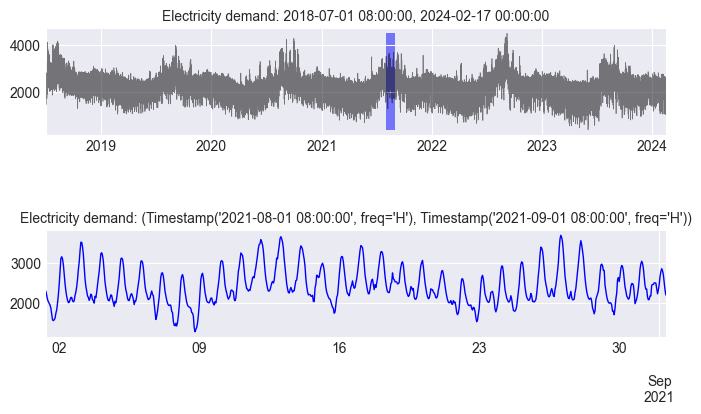

In [22]:
zoom = (data.index.min()+timedelta(days=1127), data.index.min()+timedelta(days=1158))
fig = plt.figure(figsize=(8, 4))
grid = plt.GridSpec(nrows=8, ncols=1, hspace=0.6, wspace=0)

main_ax = fig.add_subplot(grid[:3, :])
data.value.plot(ax=main_ax, c='black', alpha=0.5, linewidth=0.5)
min_y = min(data.value)
max_y = max(data.value)
main_ax.fill_between(zoom, min_y, max_y, facecolor='blue', alpha=0.5, zorder=0)
main_ax.set_title(f'Electricity demand: {data.index.min()}, {data.index.max()}', fontsize=10)
main_ax.set_xlabel('')

zoom_ax = fig.add_subplot(grid[5:, :])
data.loc[zoom[0]: zoom[1]].value.plot(ax=zoom_ax, color='blue', linewidth=1)
zoom_ax.set_title(f'Electricity demand: {zoom}', fontsize=10)
zoom_ax.set_xlabel('')

plt.subplots_adjust(hspace=1)
plt.show();

For the month of August, 2021, we can see that the demand is higher during weekdays and drops during weekends.
Is this a consistent trends in the entire dataset? You can change the timedelta and play around with the zoom.

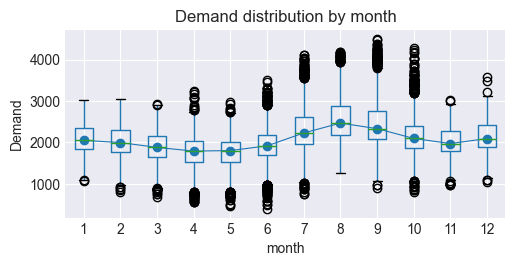

In [30]:
fig, ax = plt.subplots(figsize=(5.5, 2.5))
data_with_month = data.copy()
data_with_month['month'] = data.index.month
data_with_month.boxplot(column='value', by='month', ax=ax,)
data_with_month.groupby('month')['value'].median().plot(style='o-', linewidth=0.8, ax=ax)
ax.set_ylabel('Demand')
ax.set_title('Demand distribution by month')
fig.suptitle('')
plt.show();

There is a clear trend for a higher demand in the months of July, August, and September and a lower demand in the months of
March, April, and May

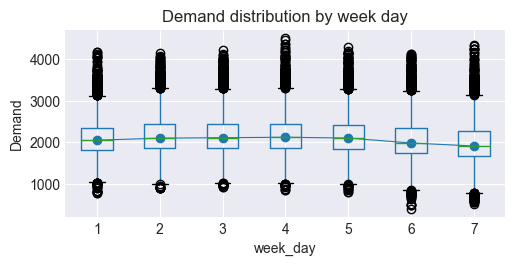

In [45]:
fig, ax = plt.subplots(figsize=(5.5, 2.5))
data_with_week = data.copy()
data_with_week['week_day'] = data_with_week.index.day_of_week + 1
data_with_week.boxplot(column='value', by='week_day', ax=ax)
data_with_week.groupby('week_day')['value'].median().plot(style='o-', linewidth=0.8, ax=ax)
ax.set_ylabel('Demand')
ax.set_title('Demand distribution by week day')
fig.suptitle('')
plt.show();

We can see a higher demand during the weekdays, and a lower demand on the weekend

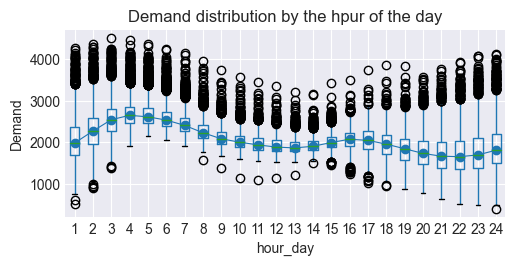

In [46]:
fig, ax = plt.subplots(figsize=(5.5, 2.5))
data_with_hours = data.copy()
data_with_hours['hour_day'] = data_with_hours.index.hour + 1
data_with_hours.boxplot(column='value', by='hour_day', ax=ax)
data_with_hours.groupby('hour_day')['value'].median().plot(style='o-', linewidth=0.8, ax=ax)
ax.set_ylabel('Demand')
ax.set_title('Demand distribution by the hpur of the day')
fig.suptitle('')
plt.show();

There is a lower demand during the day and it picks up for the hours between 12AM - 4AM

## 4. Create Train, Validation subsets

First, let's merge the exogenous variables with our dataframe

In [47]:
exogenous_features = exogenous_features.dropna()

In [48]:
exog_features = []

# Columns that ends with _sin or _cos are selected
exog_features.extend(exogenous_features.filter(regex='_sin$|_cos$').columns.tolist())

# Columns that start with temp_ are selected
exog_features.extend(exogenous_features.filter(regex='^temp_.*').columns.tolist())

# Include original features
exog_features.extend(['temperature'])

In [52]:
end_train = data.index.max() - timedelta(days=690, minutes=1) #'2022-04-01 23:59:00'
end_validation = data.index.max() - timedelta(days=55, minutes=1) #'2023-12-20 23:59:00'
print(end_train, end_validation)

2022-03-28 23:59:00 2023-12-23 23:59:00


In [53]:
# Merge target and exogenous variables in the same DataFrame
# ==============================================================================
data = data[['value']].merge(
           exogenous_features[exog_features],
           left_index=True,
           right_index=True,
           how='left'
       )

# Due to the creation of moving averages, there are missing values at the beginning
# of the series. Due to holiday_next_day there are missing values at the end.
data = data.dropna()
data = data.astype('float32')

# Split data into train-val-test
data_train = data.loc[: end_train, :].copy()
data_val   = data.loc[end_train:end_validation, :].copy()
data_test  = data.loc[end_validation:, :].copy()

In [54]:
print(f' Train Dates: {data_train.index.min()} --- {data_train.index.max()} (n={len(data_train)})')
print(f' Validation Dates: {data_val.index.min()} --- {data_val.index.max()} (n={len(data_val)})')
print(f' Test Dates: {data_test.index.min()} --- {data_test.index.max()} (n={len(data_test)})')

 Train Dates: 2018-07-01 09:00:00 --- 2022-03-28 23:00:00 (n=32799)
 Validation Dates: 2022-03-29 00:00:00 --- 2023-12-23 23:00:00 (n=15240)
 Test Dates: 2023-12-24 00:00:00 --- 2024-02-17 00:00:00 (n=1321)


## 5. Create models

### Baseline Model

First, create a baseline model that simply predicts that the value of the current hour will be the same as the one 24 hours
prior

In [55]:
forecaster = ForecasterEquivalentDate(
                 offset    = pd.DateOffset(days=1),
                 n_offsets = 1
             )

# Train forecaster
# ==============================================================================
forecaster.fit(y=data.loc[:end_validation, 'value'])
forecaster

ForecasterEquivalentDate 
Offset: <DateOffset: days=1> 
Number of offsets: 1 
Aggregation function: mean 
Window size: 24 
Training range: [Timestamp('2018-07-01 09:00:00'), Timestamp('2023-12-23 23:00:00')] 
Training index type: DatetimeIndex 
Training index frequency: H 
Creation date: 2024-02-19 10:14:54 
Last fit date: 2024-02-19 10:14:54 
Skforecast version: 0.11.0 
Python version: 3.10.7 
Forecaster id: None 

Backtesting to see mean absolute error

In [56]:
metric, predictions = backtesting_forecaster(
                          forecaster         = forecaster,
                          y                  = data['value'],
                          steps              = 24,
                          metric             = 'mean_absolute_error',
                          initial_train_size = len(data.loc[:end_validation]),
                          refit              = False,
                          n_jobs             = 'auto',
                          verbose            = False,
                          show_progress      = True
                      )

print(f"Backtest error (MAE): {metric}")

  0%|          | 0/56 [00:00<?, ?it/s]

Backtest error (MAE): 153.94776916503906


### Recursive multi-step forecasting

Using the ForecasterAutoreg from the skforecast.ForecasterAutoreg library to create 24 hours of lag values to predict
demand

In [58]:
forecaster = ForecasterAutoreg(
                 regressor = LGBMRegressor(random_state=16000, verbose=-1),
                 lags      = 24
             )

forecaster.fit(y=data.loc[:end_validation, 'value'])
forecaster

ForecasterAutoreg 
Regressor: LGBMRegressor(random_state=16000, verbose=-1) 
Lags: [ 1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23 24] 
Transformer for y: None 
Transformer for exog: None 
Window size: 24 
Weight function included: False 
Differentiation order: None 
Exogenous included: False 
Type of exogenous variable: None 
Exogenous variables names: None 
Training range: [Timestamp('2018-07-01 09:00:00'), Timestamp('2023-12-23 23:00:00')] 
Training index type: DatetimeIndex 
Training index frequency: H 
Regressor parameters: {'boosting_type': 'gbdt', 'class_weight': None, 'colsample_bytree': 1.0, 'importance_type': 'split', 'learning_rate': 0.1, 'max_depth': -1, 'min_child_samples': 20, 'min_child_weight': 0.001, 'min_split_gain': 0.0, 'n_estimators': 100, 'n_jobs': None, 'num_leaves': 31, 'objective': None, 'random_state': 16000, 'reg_alpha': 0.0, 'reg_lambda': 0.0, 'subsample': 1.0, 'subsample_for_bin': 200000, 'subsample_freq': 0, 'verbose': -1} 
fit_kwargs

In [60]:
metric, predictions = backtesting_forecaster(
                          forecaster         = forecaster,
                          y                  = data['value'],
                          steps              = 24,
                          metric             = 'mean_absolute_error',
                          initial_train_size = len(data.loc[:end_validation]),
                          refit              = False,
                          n_jobs             = 'auto',
                          verbose            = True,
                          show_progress      = True
                      )

Information of backtesting process
----------------------------------
Number of observations used for initial training: 48039
Number of observations used for backtesting: 1321
    Number of folds: 56
    Number of steps per fold: 24
    Number of steps to exclude from the end of each train set before test (gap): 0
    Last fold only includes 1 observations.

Fold: 0
    Training:   2018-07-01 09:00:00 -- 2023-12-23 23:00:00  (n=48039)
    Validation: 2023-12-24 00:00:00 -- 2023-12-24 23:00:00  (n=24)
Fold: 1
    Training:   2018-07-01 09:00:00 -- 2023-12-23 23:00:00  (n=48039)
    Validation: 2023-12-25 00:00:00 -- 2023-12-25 23:00:00  (n=24)
Fold: 2
    Training:   2018-07-01 09:00:00 -- 2023-12-23 23:00:00  (n=48039)
    Validation: 2023-12-26 00:00:00 -- 2023-12-26 23:00:00  (n=24)
Fold: 3
    Training:   2018-07-01 09:00:00 -- 2023-12-23 23:00:00  (n=48039)
    Validation: 2023-12-27 00:00:00 -- 2023-12-27 23:00:00  (n=24)
Fold: 4
    Training:   2018-07-01 09:00:00 -- 2023-12-23 2

  0%|          | 0/56 [00:00<?, ?it/s]

In [61]:
print(f'Backtest error (MAE): {metric}')

Backtest error (MAE): 143.99557038389588


We are already seeing some improvements

### Tune Hyperparameters

Let's tune the hyperparameters by using bayesian search, which trains and backtests the model with multiple different hyperparameters and tunes them after each run to optimize them

In [62]:
forecaster = ForecasterAutoreg(
                 regressor = LGBMRegressor(random_state=15926, verbose=-1),
                 lags      = 24, # This value will be replaced in the grid search
             )

lags_grid = [24, [1, 2, 3, 23, 24, 25, 47, 48, 49]]

# Regressor hyperparameters search space
def search_space(trial):
    search_space  = {
        'n_estimators'  : trial.suggest_int('n_estimators', 600, 1200, step=100),
        'max_depth'     : trial.suggest_int('max_depth', 3, 10, step=1),
        'learning_rate' : trial.suggest_float('learning_rate', 0.01, 0.5),
        'reg_alpha'     : trial.suggest_float('reg_alpha', 0, 1, step=0.1),
        'reg_lambda'    : trial.suggest_float('reg_lambda', 0, 1, step=0.1),
    } 
    return search_space

results_search, frozen_trial = bayesian_search_forecaster(
                                   forecaster         = forecaster,
                                   y                  = data.loc[:end_validation, 'value'],
                                   steps              = 24,
                                   metric             = 'mean_absolute_error',
                                   search_space       = search_space,
                                   lags_grid          = lags_grid,
                                   initial_train_size = len(data[:end_train]),
                                   refit              = False,
                                   n_trials           = 20, # Increase for more exhaustive search
                                   random_state       = 123,
                                   return_best        = True,
                                   n_jobs             = 'auto',
                                   verbose            = True,
                                   show_progress      = True
                               )

Number of models compared: 40,
         20 bayesian search in each lag configuration.


lags grid:   0%|          | 0/2 [00:00<?, ?it/s]

Information of backtesting process
----------------------------------
Number of observations used for initial training: 32799
Number of observations used for backtesting: 15240
    Number of folds: 635
    Number of steps per fold: 24
    Number of steps to exclude from the end of each train set before test (gap): 0

Fold: 0
    Training:   2018-07-01 09:00:00 -- 2022-03-28 23:00:00  (n=32799)
    Validation: 2022-03-29 00:00:00 -- 2022-03-29 23:00:00  (n=24)
Fold: 1
    Training:   2018-07-01 09:00:00 -- 2022-03-28 23:00:00  (n=32799)
    Validation: 2022-03-30 00:00:00 -- 2022-03-30 23:00:00  (n=24)
Fold: 2
    Training:   2018-07-01 09:00:00 -- 2022-03-28 23:00:00  (n=32799)
    Validation: 2022-03-31 00:00:00 -- 2022-03-31 23:00:00  (n=24)
Fold: 3
    Training:   2018-07-01 09:00:00 -- 2022-03-28 23:00:00  (n=32799)
    Validation: 2022-04-01 00:00:00 -- 2022-04-01 23:00:00  (n=24)
Fold: 4
    Training:   2018-07-01 09:00:00 -- 2022-03-28 23:00:00  (n=32799)
    Validation: 2022-04

Information of backtesting process
----------------------------------
Number of observations used for initial training: 32799
Number of observations used for backtesting: 15240
    Number of folds: 635
    Number of steps per fold: 24
    Number of steps to exclude from the end of each train set before test (gap): 0

Fold: 0
    Training:   2018-07-01 09:00:00 -- 2022-03-28 23:00:00  (n=32799)
    Validation: 2022-03-29 00:00:00 -- 2022-03-29 23:00:00  (n=24)
Fold: 1
    Training:   2018-07-01 09:00:00 -- 2022-03-28 23:00:00  (n=32799)
    Validation: 2022-03-30 00:00:00 -- 2022-03-30 23:00:00  (n=24)
Fold: 2
    Training:   2018-07-01 09:00:00 -- 2022-03-28 23:00:00  (n=32799)
    Validation: 2022-03-31 00:00:00 -- 2022-03-31 23:00:00  (n=24)
Fold: 3
    Training:   2018-07-01 09:00:00 -- 2022-03-28 23:00:00  (n=32799)
    Validation: 2022-04-01 00:00:00 -- 2022-04-01 23:00:00  (n=24)
Fold: 4
    Training:   2018-07-01 09:00:00 -- 2022-03-28 23:00:00  (n=32799)
    Validation: 2022-04

Information of backtesting process
----------------------------------
Number of observations used for initial training: 32799
Number of observations used for backtesting: 15240
    Number of folds: 635
    Number of steps per fold: 24
    Number of steps to exclude from the end of each train set before test (gap): 0

Fold: 0
    Training:   2018-07-01 09:00:00 -- 2022-03-28 23:00:00  (n=32799)
    Validation: 2022-03-29 00:00:00 -- 2022-03-29 23:00:00  (n=24)
Fold: 1
    Training:   2018-07-01 09:00:00 -- 2022-03-28 23:00:00  (n=32799)
    Validation: 2022-03-30 00:00:00 -- 2022-03-30 23:00:00  (n=24)
Fold: 2
    Training:   2018-07-01 09:00:00 -- 2022-03-28 23:00:00  (n=32799)
    Validation: 2022-03-31 00:00:00 -- 2022-03-31 23:00:00  (n=24)
Fold: 3
    Training:   2018-07-01 09:00:00 -- 2022-03-28 23:00:00  (n=32799)
    Validation: 2022-04-01 00:00:00 -- 2022-04-01 23:00:00  (n=24)
Fold: 4
    Training:   2018-07-01 09:00:00 -- 2022-03-28 23:00:00  (n=32799)
    Validation: 2022-04

Information of backtesting process
----------------------------------
Number of observations used for initial training: 32799
Number of observations used for backtesting: 15240
    Number of folds: 635
    Number of steps per fold: 24
    Number of steps to exclude from the end of each train set before test (gap): 0

Fold: 0
    Training:   2018-07-01 09:00:00 -- 2022-03-28 23:00:00  (n=32799)
    Validation: 2022-03-29 00:00:00 -- 2022-03-29 23:00:00  (n=24)
Fold: 1
    Training:   2018-07-01 09:00:00 -- 2022-03-28 23:00:00  (n=32799)
    Validation: 2022-03-30 00:00:00 -- 2022-03-30 23:00:00  (n=24)
Fold: 2
    Training:   2018-07-01 09:00:00 -- 2022-03-28 23:00:00  (n=32799)
    Validation: 2022-03-31 00:00:00 -- 2022-03-31 23:00:00  (n=24)
Fold: 3
    Training:   2018-07-01 09:00:00 -- 2022-03-28 23:00:00  (n=32799)
    Validation: 2022-04-01 00:00:00 -- 2022-04-01 23:00:00  (n=24)
Fold: 4
    Training:   2018-07-01 09:00:00 -- 2022-03-28 23:00:00  (n=32799)
    Validation: 2022-04

Information of backtesting process
----------------------------------
Number of observations used for initial training: 32799
Number of observations used for backtesting: 15240
    Number of folds: 635
    Number of steps per fold: 24
    Number of steps to exclude from the end of each train set before test (gap): 0

Fold: 0
    Training:   2018-07-01 09:00:00 -- 2022-03-28 23:00:00  (n=32799)
    Validation: 2022-03-29 00:00:00 -- 2022-03-29 23:00:00  (n=24)
Fold: 1
    Training:   2018-07-01 09:00:00 -- 2022-03-28 23:00:00  (n=32799)
    Validation: 2022-03-30 00:00:00 -- 2022-03-30 23:00:00  (n=24)
Fold: 2
    Training:   2018-07-01 09:00:00 -- 2022-03-28 23:00:00  (n=32799)
    Validation: 2022-03-31 00:00:00 -- 2022-03-31 23:00:00  (n=24)
Fold: 3
    Training:   2018-07-01 09:00:00 -- 2022-03-28 23:00:00  (n=32799)
    Validation: 2022-04-01 00:00:00 -- 2022-04-01 23:00:00  (n=24)
Fold: 4
    Training:   2018-07-01 09:00:00 -- 2022-03-28 23:00:00  (n=32799)
    Validation: 2022-04

Information of backtesting process
----------------------------------
Number of observations used for initial training: 32799
Number of observations used for backtesting: 15240
    Number of folds: 635
    Number of steps per fold: 24
    Number of steps to exclude from the end of each train set before test (gap): 0

Fold: 0
    Training:   2018-07-01 09:00:00 -- 2022-03-28 23:00:00  (n=32799)
    Validation: 2022-03-29 00:00:00 -- 2022-03-29 23:00:00  (n=24)
Fold: 1
    Training:   2018-07-01 09:00:00 -- 2022-03-28 23:00:00  (n=32799)
    Validation: 2022-03-30 00:00:00 -- 2022-03-30 23:00:00  (n=24)
Fold: 2
    Training:   2018-07-01 09:00:00 -- 2022-03-28 23:00:00  (n=32799)
    Validation: 2022-03-31 00:00:00 -- 2022-03-31 23:00:00  (n=24)
Fold: 3
    Training:   2018-07-01 09:00:00 -- 2022-03-28 23:00:00  (n=32799)
    Validation: 2022-04-01 00:00:00 -- 2022-04-01 23:00:00  (n=24)
Fold: 4
    Training:   2018-07-01 09:00:00 -- 2022-03-28 23:00:00  (n=32799)
    Validation: 2022-04

Information of backtesting process
----------------------------------
Number of observations used for initial training: 32799
Number of observations used for backtesting: 15240
    Number of folds: 635
    Number of steps per fold: 24
    Number of steps to exclude from the end of each train set before test (gap): 0

Fold: 0
    Training:   2018-07-01 09:00:00 -- 2022-03-28 23:00:00  (n=32799)
    Validation: 2022-03-29 00:00:00 -- 2022-03-29 23:00:00  (n=24)
Fold: 1
    Training:   2018-07-01 09:00:00 -- 2022-03-28 23:00:00  (n=32799)
    Validation: 2022-03-30 00:00:00 -- 2022-03-30 23:00:00  (n=24)
Fold: 2
    Training:   2018-07-01 09:00:00 -- 2022-03-28 23:00:00  (n=32799)
    Validation: 2022-03-31 00:00:00 -- 2022-03-31 23:00:00  (n=24)
Fold: 3
    Training:   2018-07-01 09:00:00 -- 2022-03-28 23:00:00  (n=32799)
    Validation: 2022-04-01 00:00:00 -- 2022-04-01 23:00:00  (n=24)
Fold: 4
    Training:   2018-07-01 09:00:00 -- 2022-03-28 23:00:00  (n=32799)
    Validation: 2022-04

Information of backtesting process
----------------------------------
Number of observations used for initial training: 32799
Number of observations used for backtesting: 15240
    Number of folds: 635
    Number of steps per fold: 24
    Number of steps to exclude from the end of each train set before test (gap): 0

Fold: 0
    Training:   2018-07-01 09:00:00 -- 2022-03-28 23:00:00  (n=32799)
    Validation: 2022-03-29 00:00:00 -- 2022-03-29 23:00:00  (n=24)
Fold: 1
    Training:   2018-07-01 09:00:00 -- 2022-03-28 23:00:00  (n=32799)
    Validation: 2022-03-30 00:00:00 -- 2022-03-30 23:00:00  (n=24)
Fold: 2
    Training:   2018-07-01 09:00:00 -- 2022-03-28 23:00:00  (n=32799)
    Validation: 2022-03-31 00:00:00 -- 2022-03-31 23:00:00  (n=24)
Fold: 3
    Training:   2018-07-01 09:00:00 -- 2022-03-28 23:00:00  (n=32799)
    Validation: 2022-04-01 00:00:00 -- 2022-04-01 23:00:00  (n=24)
Fold: 4
    Training:   2018-07-01 09:00:00 -- 2022-03-28 23:00:00  (n=32799)
    Validation: 2022-04

Information of backtesting process
----------------------------------
Number of observations used for initial training: 32799
Number of observations used for backtesting: 15240
    Number of folds: 635
    Number of steps per fold: 24
    Number of steps to exclude from the end of each train set before test (gap): 0

Fold: 0
    Training:   2018-07-01 09:00:00 -- 2022-03-28 23:00:00  (n=32799)
    Validation: 2022-03-29 00:00:00 -- 2022-03-29 23:00:00  (n=24)
Fold: 1
    Training:   2018-07-01 09:00:00 -- 2022-03-28 23:00:00  (n=32799)
    Validation: 2022-03-30 00:00:00 -- 2022-03-30 23:00:00  (n=24)
Fold: 2
    Training:   2018-07-01 09:00:00 -- 2022-03-28 23:00:00  (n=32799)
    Validation: 2022-03-31 00:00:00 -- 2022-03-31 23:00:00  (n=24)
Fold: 3
    Training:   2018-07-01 09:00:00 -- 2022-03-28 23:00:00  (n=32799)
    Validation: 2022-04-01 00:00:00 -- 2022-04-01 23:00:00  (n=24)
Fold: 4
    Training:   2018-07-01 09:00:00 -- 2022-03-28 23:00:00  (n=32799)
    Validation: 2022-04

Information of backtesting process
----------------------------------
Number of observations used for initial training: 32799
Number of observations used for backtesting: 15240
    Number of folds: 635
    Number of steps per fold: 24
    Number of steps to exclude from the end of each train set before test (gap): 0

Fold: 0
    Training:   2018-07-01 09:00:00 -- 2022-03-28 23:00:00  (n=32799)
    Validation: 2022-03-29 00:00:00 -- 2022-03-29 23:00:00  (n=24)
Fold: 1
    Training:   2018-07-01 09:00:00 -- 2022-03-28 23:00:00  (n=32799)
    Validation: 2022-03-30 00:00:00 -- 2022-03-30 23:00:00  (n=24)
Fold: 2
    Training:   2018-07-01 09:00:00 -- 2022-03-28 23:00:00  (n=32799)
    Validation: 2022-03-31 00:00:00 -- 2022-03-31 23:00:00  (n=24)
Fold: 3
    Training:   2018-07-01 09:00:00 -- 2022-03-28 23:00:00  (n=32799)
    Validation: 2022-04-01 00:00:00 -- 2022-04-01 23:00:00  (n=24)
Fold: 4
    Training:   2018-07-01 09:00:00 -- 2022-03-28 23:00:00  (n=32799)
    Validation: 2022-04

Information of backtesting process
----------------------------------
Number of observations used for initial training: 32799
Number of observations used for backtesting: 15240
    Number of folds: 635
    Number of steps per fold: 24
    Number of steps to exclude from the end of each train set before test (gap): 0

Fold: 0
    Training:   2018-07-01 09:00:00 -- 2022-03-28 23:00:00  (n=32799)
    Validation: 2022-03-29 00:00:00 -- 2022-03-29 23:00:00  (n=24)
Fold: 1
    Training:   2018-07-01 09:00:00 -- 2022-03-28 23:00:00  (n=32799)
    Validation: 2022-03-30 00:00:00 -- 2022-03-30 23:00:00  (n=24)
Fold: 2
    Training:   2018-07-01 09:00:00 -- 2022-03-28 23:00:00  (n=32799)
    Validation: 2022-03-31 00:00:00 -- 2022-03-31 23:00:00  (n=24)
Fold: 3
    Training:   2018-07-01 09:00:00 -- 2022-03-28 23:00:00  (n=32799)
    Validation: 2022-04-01 00:00:00 -- 2022-04-01 23:00:00  (n=24)
Fold: 4
    Training:   2018-07-01 09:00:00 -- 2022-03-28 23:00:00  (n=32799)
    Validation: 2022-04

Information of backtesting process
----------------------------------
Number of observations used for initial training: 32799
Number of observations used for backtesting: 15240
    Number of folds: 635
    Number of steps per fold: 24
    Number of steps to exclude from the end of each train set before test (gap): 0

Fold: 0
    Training:   2018-07-01 09:00:00 -- 2022-03-28 23:00:00  (n=32799)
    Validation: 2022-03-29 00:00:00 -- 2022-03-29 23:00:00  (n=24)
Fold: 1
    Training:   2018-07-01 09:00:00 -- 2022-03-28 23:00:00  (n=32799)
    Validation: 2022-03-30 00:00:00 -- 2022-03-30 23:00:00  (n=24)
Fold: 2
    Training:   2018-07-01 09:00:00 -- 2022-03-28 23:00:00  (n=32799)
    Validation: 2022-03-31 00:00:00 -- 2022-03-31 23:00:00  (n=24)
Fold: 3
    Training:   2018-07-01 09:00:00 -- 2022-03-28 23:00:00  (n=32799)
    Validation: 2022-04-01 00:00:00 -- 2022-04-01 23:00:00  (n=24)
Fold: 4
    Training:   2018-07-01 09:00:00 -- 2022-03-28 23:00:00  (n=32799)
    Validation: 2022-04

Information of backtesting process
----------------------------------
Number of observations used for initial training: 32799
Number of observations used for backtesting: 15240
    Number of folds: 635
    Number of steps per fold: 24
    Number of steps to exclude from the end of each train set before test (gap): 0

Fold: 0
    Training:   2018-07-01 09:00:00 -- 2022-03-28 23:00:00  (n=32799)
    Validation: 2022-03-29 00:00:00 -- 2022-03-29 23:00:00  (n=24)
Fold: 1
    Training:   2018-07-01 09:00:00 -- 2022-03-28 23:00:00  (n=32799)
    Validation: 2022-03-30 00:00:00 -- 2022-03-30 23:00:00  (n=24)
Fold: 2
    Training:   2018-07-01 09:00:00 -- 2022-03-28 23:00:00  (n=32799)
    Validation: 2022-03-31 00:00:00 -- 2022-03-31 23:00:00  (n=24)
Fold: 3
    Training:   2018-07-01 09:00:00 -- 2022-03-28 23:00:00  (n=32799)
    Validation: 2022-04-01 00:00:00 -- 2022-04-01 23:00:00  (n=24)
Fold: 4
    Training:   2018-07-01 09:00:00 -- 2022-03-28 23:00:00  (n=32799)
    Validation: 2022-04

Information of backtesting process
----------------------------------
Number of observations used for initial training: 32799
Number of observations used for backtesting: 15240
    Number of folds: 635
    Number of steps per fold: 24
    Number of steps to exclude from the end of each train set before test (gap): 0

Fold: 0
    Training:   2018-07-01 09:00:00 -- 2022-03-28 23:00:00  (n=32799)
    Validation: 2022-03-29 00:00:00 -- 2022-03-29 23:00:00  (n=24)
Fold: 1
    Training:   2018-07-01 09:00:00 -- 2022-03-28 23:00:00  (n=32799)
    Validation: 2022-03-30 00:00:00 -- 2022-03-30 23:00:00  (n=24)
Fold: 2
    Training:   2018-07-01 09:00:00 -- 2022-03-28 23:00:00  (n=32799)
    Validation: 2022-03-31 00:00:00 -- 2022-03-31 23:00:00  (n=24)
Fold: 3
    Training:   2018-07-01 09:00:00 -- 2022-03-28 23:00:00  (n=32799)
    Validation: 2022-04-01 00:00:00 -- 2022-04-01 23:00:00  (n=24)
Fold: 4
    Training:   2018-07-01 09:00:00 -- 2022-03-28 23:00:00  (n=32799)
    Validation: 2022-04

Information of backtesting process
----------------------------------
Number of observations used for initial training: 32799
Number of observations used for backtesting: 15240
    Number of folds: 635
    Number of steps per fold: 24
    Number of steps to exclude from the end of each train set before test (gap): 0

Fold: 0
    Training:   2018-07-01 09:00:00 -- 2022-03-28 23:00:00  (n=32799)
    Validation: 2022-03-29 00:00:00 -- 2022-03-29 23:00:00  (n=24)
Fold: 1
    Training:   2018-07-01 09:00:00 -- 2022-03-28 23:00:00  (n=32799)
    Validation: 2022-03-30 00:00:00 -- 2022-03-30 23:00:00  (n=24)
Fold: 2
    Training:   2018-07-01 09:00:00 -- 2022-03-28 23:00:00  (n=32799)
    Validation: 2022-03-31 00:00:00 -- 2022-03-31 23:00:00  (n=24)
Fold: 3
    Training:   2018-07-01 09:00:00 -- 2022-03-28 23:00:00  (n=32799)
    Validation: 2022-04-01 00:00:00 -- 2022-04-01 23:00:00  (n=24)
Fold: 4
    Training:   2018-07-01 09:00:00 -- 2022-03-28 23:00:00  (n=32799)
    Validation: 2022-04

Information of backtesting process
----------------------------------
Number of observations used for initial training: 32799
Number of observations used for backtesting: 15240
    Number of folds: 635
    Number of steps per fold: 24
    Number of steps to exclude from the end of each train set before test (gap): 0

Fold: 0
    Training:   2018-07-01 09:00:00 -- 2022-03-28 23:00:00  (n=32799)
    Validation: 2022-03-29 00:00:00 -- 2022-03-29 23:00:00  (n=24)
Fold: 1
    Training:   2018-07-01 09:00:00 -- 2022-03-28 23:00:00  (n=32799)
    Validation: 2022-03-30 00:00:00 -- 2022-03-30 23:00:00  (n=24)
Fold: 2
    Training:   2018-07-01 09:00:00 -- 2022-03-28 23:00:00  (n=32799)
    Validation: 2022-03-31 00:00:00 -- 2022-03-31 23:00:00  (n=24)
Fold: 3
    Training:   2018-07-01 09:00:00 -- 2022-03-28 23:00:00  (n=32799)
    Validation: 2022-04-01 00:00:00 -- 2022-04-01 23:00:00  (n=24)
Fold: 4
    Training:   2018-07-01 09:00:00 -- 2022-03-28 23:00:00  (n=32799)
    Validation: 2022-04

Information of backtesting process
----------------------------------
Number of observations used for initial training: 32799
Number of observations used for backtesting: 15240
    Number of folds: 635
    Number of steps per fold: 24
    Number of steps to exclude from the end of each train set before test (gap): 0

Fold: 0
    Training:   2018-07-01 09:00:00 -- 2022-03-28 23:00:00  (n=32799)
    Validation: 2022-03-29 00:00:00 -- 2022-03-29 23:00:00  (n=24)
Fold: 1
    Training:   2018-07-01 09:00:00 -- 2022-03-28 23:00:00  (n=32799)
    Validation: 2022-03-30 00:00:00 -- 2022-03-30 23:00:00  (n=24)
Fold: 2
    Training:   2018-07-01 09:00:00 -- 2022-03-28 23:00:00  (n=32799)
    Validation: 2022-03-31 00:00:00 -- 2022-03-31 23:00:00  (n=24)
Fold: 3
    Training:   2018-07-01 09:00:00 -- 2022-03-28 23:00:00  (n=32799)
    Validation: 2022-04-01 00:00:00 -- 2022-04-01 23:00:00  (n=24)
Fold: 4
    Training:   2018-07-01 09:00:00 -- 2022-03-28 23:00:00  (n=32799)
    Validation: 2022-04

Information of backtesting process
----------------------------------
Number of observations used for initial training: 32799
Number of observations used for backtesting: 15240
    Number of folds: 635
    Number of steps per fold: 24
    Number of steps to exclude from the end of each train set before test (gap): 0

Fold: 0
    Training:   2018-07-01 09:00:00 -- 2022-03-28 23:00:00  (n=32799)
    Validation: 2022-03-29 00:00:00 -- 2022-03-29 23:00:00  (n=24)
Fold: 1
    Training:   2018-07-01 09:00:00 -- 2022-03-28 23:00:00  (n=32799)
    Validation: 2022-03-30 00:00:00 -- 2022-03-30 23:00:00  (n=24)
Fold: 2
    Training:   2018-07-01 09:00:00 -- 2022-03-28 23:00:00  (n=32799)
    Validation: 2022-03-31 00:00:00 -- 2022-03-31 23:00:00  (n=24)
Fold: 3
    Training:   2018-07-01 09:00:00 -- 2022-03-28 23:00:00  (n=32799)
    Validation: 2022-04-01 00:00:00 -- 2022-04-01 23:00:00  (n=24)
Fold: 4
    Training:   2018-07-01 09:00:00 -- 2022-03-28 23:00:00  (n=32799)
    Validation: 2022-04

Information of backtesting process
----------------------------------
Number of observations used for initial training: 32799
Number of observations used for backtesting: 15240
    Number of folds: 635
    Number of steps per fold: 24
    Number of steps to exclude from the end of each train set before test (gap): 0

Fold: 0
    Training:   2018-07-01 09:00:00 -- 2022-03-28 23:00:00  (n=32799)
    Validation: 2022-03-29 00:00:00 -- 2022-03-29 23:00:00  (n=24)
Fold: 1
    Training:   2018-07-01 09:00:00 -- 2022-03-28 23:00:00  (n=32799)
    Validation: 2022-03-30 00:00:00 -- 2022-03-30 23:00:00  (n=24)
Fold: 2
    Training:   2018-07-01 09:00:00 -- 2022-03-28 23:00:00  (n=32799)
    Validation: 2022-03-31 00:00:00 -- 2022-03-31 23:00:00  (n=24)
Fold: 3
    Training:   2018-07-01 09:00:00 -- 2022-03-28 23:00:00  (n=32799)
    Validation: 2022-04-01 00:00:00 -- 2022-04-01 23:00:00  (n=24)
Fold: 4
    Training:   2018-07-01 09:00:00 -- 2022-03-28 23:00:00  (n=32799)
    Validation: 2022-04

Information of backtesting process
----------------------------------
Number of observations used for initial training: 32799
Number of observations used for backtesting: 15240
    Number of folds: 635
    Number of steps per fold: 24
    Number of steps to exclude from the end of each train set before test (gap): 0

Fold: 0
    Training:   2018-07-01 09:00:00 -- 2022-03-28 23:00:00  (n=32799)
    Validation: 2022-03-29 00:00:00 -- 2022-03-29 23:00:00  (n=24)
Fold: 1
    Training:   2018-07-01 09:00:00 -- 2022-03-28 23:00:00  (n=32799)
    Validation: 2022-03-30 00:00:00 -- 2022-03-30 23:00:00  (n=24)
Fold: 2
    Training:   2018-07-01 09:00:00 -- 2022-03-28 23:00:00  (n=32799)
    Validation: 2022-03-31 00:00:00 -- 2022-03-31 23:00:00  (n=24)
Fold: 3
    Training:   2018-07-01 09:00:00 -- 2022-03-28 23:00:00  (n=32799)
    Validation: 2022-04-01 00:00:00 -- 2022-04-01 23:00:00  (n=24)
Fold: 4
    Training:   2018-07-01 09:00:00 -- 2022-03-28 23:00:00  (n=32799)
    Validation: 2022-04

Information of backtesting process
----------------------------------
Number of observations used for initial training: 32799
Number of observations used for backtesting: 15240
    Number of folds: 635
    Number of steps per fold: 24
    Number of steps to exclude from the end of each train set before test (gap): 0

Fold: 0
    Training:   2018-07-01 09:00:00 -- 2022-03-28 23:00:00  (n=32799)
    Validation: 2022-03-29 00:00:00 -- 2022-03-29 23:00:00  (n=24)
Fold: 1
    Training:   2018-07-01 09:00:00 -- 2022-03-28 23:00:00  (n=32799)
    Validation: 2022-03-30 00:00:00 -- 2022-03-30 23:00:00  (n=24)
Fold: 2
    Training:   2018-07-01 09:00:00 -- 2022-03-28 23:00:00  (n=32799)
    Validation: 2022-03-31 00:00:00 -- 2022-03-31 23:00:00  (n=24)
Fold: 3
    Training:   2018-07-01 09:00:00 -- 2022-03-28 23:00:00  (n=32799)
    Validation: 2022-04-01 00:00:00 -- 2022-04-01 23:00:00  (n=24)
Fold: 4
    Training:   2018-07-01 09:00:00 -- 2022-03-28 23:00:00  (n=32799)
    Validation: 2022-04

Information of backtesting process
----------------------------------
Number of observations used for initial training: 32799
Number of observations used for backtesting: 15240
    Number of folds: 635
    Number of steps per fold: 24
    Number of steps to exclude from the end of each train set before test (gap): 0

Fold: 0
    Training:   2018-07-01 09:00:00 -- 2022-03-28 23:00:00  (n=32799)
    Validation: 2022-03-29 00:00:00 -- 2022-03-29 23:00:00  (n=24)
Fold: 1
    Training:   2018-07-01 09:00:00 -- 2022-03-28 23:00:00  (n=32799)
    Validation: 2022-03-30 00:00:00 -- 2022-03-30 23:00:00  (n=24)
Fold: 2
    Training:   2018-07-01 09:00:00 -- 2022-03-28 23:00:00  (n=32799)
    Validation: 2022-03-31 00:00:00 -- 2022-03-31 23:00:00  (n=24)
Fold: 3
    Training:   2018-07-01 09:00:00 -- 2022-03-28 23:00:00  (n=32799)
    Validation: 2022-04-01 00:00:00 -- 2022-04-01 23:00:00  (n=24)
Fold: 4
    Training:   2018-07-01 09:00:00 -- 2022-03-28 23:00:00  (n=32799)
    Validation: 2022-04

Information of backtesting process
----------------------------------
Number of observations used for initial training: 32799
Number of observations used for backtesting: 15240
    Number of folds: 635
    Number of steps per fold: 24
    Number of steps to exclude from the end of each train set before test (gap): 0

Fold: 0
    Training:   2018-07-01 09:00:00 -- 2022-03-28 23:00:00  (n=32799)
    Validation: 2022-03-29 00:00:00 -- 2022-03-29 23:00:00  (n=24)
Fold: 1
    Training:   2018-07-01 09:00:00 -- 2022-03-28 23:00:00  (n=32799)
    Validation: 2022-03-30 00:00:00 -- 2022-03-30 23:00:00  (n=24)
Fold: 2
    Training:   2018-07-01 09:00:00 -- 2022-03-28 23:00:00  (n=32799)
    Validation: 2022-03-31 00:00:00 -- 2022-03-31 23:00:00  (n=24)
Fold: 3
    Training:   2018-07-01 09:00:00 -- 2022-03-28 23:00:00  (n=32799)
    Validation: 2022-04-01 00:00:00 -- 2022-04-01 23:00:00  (n=24)
Fold: 4
    Training:   2018-07-01 09:00:00 -- 2022-03-28 23:00:00  (n=32799)
    Validation: 2022-04

Information of backtesting process
----------------------------------
Number of observations used for initial training: 32799
Number of observations used for backtesting: 15240
    Number of folds: 635
    Number of steps per fold: 24
    Number of steps to exclude from the end of each train set before test (gap): 0

Fold: 0
    Training:   2018-07-01 09:00:00 -- 2022-03-28 23:00:00  (n=32799)
    Validation: 2022-03-29 00:00:00 -- 2022-03-29 23:00:00  (n=24)
Fold: 1
    Training:   2018-07-01 09:00:00 -- 2022-03-28 23:00:00  (n=32799)
    Validation: 2022-03-30 00:00:00 -- 2022-03-30 23:00:00  (n=24)
Fold: 2
    Training:   2018-07-01 09:00:00 -- 2022-03-28 23:00:00  (n=32799)
    Validation: 2022-03-31 00:00:00 -- 2022-03-31 23:00:00  (n=24)
Fold: 3
    Training:   2018-07-01 09:00:00 -- 2022-03-28 23:00:00  (n=32799)
    Validation: 2022-04-01 00:00:00 -- 2022-04-01 23:00:00  (n=24)
Fold: 4
    Training:   2018-07-01 09:00:00 -- 2022-03-28 23:00:00  (n=32799)
    Validation: 2022-04

Information of backtesting process
----------------------------------
Number of observations used for initial training: 32799
Number of observations used for backtesting: 15240
    Number of folds: 635
    Number of steps per fold: 24
    Number of steps to exclude from the end of each train set before test (gap): 0

Fold: 0
    Training:   2018-07-01 09:00:00 -- 2022-03-28 23:00:00  (n=32799)
    Validation: 2022-03-29 00:00:00 -- 2022-03-29 23:00:00  (n=24)
Fold: 1
    Training:   2018-07-01 09:00:00 -- 2022-03-28 23:00:00  (n=32799)
    Validation: 2022-03-30 00:00:00 -- 2022-03-30 23:00:00  (n=24)
Fold: 2
    Training:   2018-07-01 09:00:00 -- 2022-03-28 23:00:00  (n=32799)
    Validation: 2022-03-31 00:00:00 -- 2022-03-31 23:00:00  (n=24)
Fold: 3
    Training:   2018-07-01 09:00:00 -- 2022-03-28 23:00:00  (n=32799)
    Validation: 2022-04-01 00:00:00 -- 2022-04-01 23:00:00  (n=24)
Fold: 4
    Training:   2018-07-01 09:00:00 -- 2022-03-28 23:00:00  (n=32799)
    Validation: 2022-04

Information of backtesting process
----------------------------------
Number of observations used for initial training: 32799
Number of observations used for backtesting: 15240
    Number of folds: 635
    Number of steps per fold: 24
    Number of steps to exclude from the end of each train set before test (gap): 0

Fold: 0
    Training:   2018-07-01 09:00:00 -- 2022-03-28 23:00:00  (n=32799)
    Validation: 2022-03-29 00:00:00 -- 2022-03-29 23:00:00  (n=24)
Fold: 1
    Training:   2018-07-01 09:00:00 -- 2022-03-28 23:00:00  (n=32799)
    Validation: 2022-03-30 00:00:00 -- 2022-03-30 23:00:00  (n=24)
Fold: 2
    Training:   2018-07-01 09:00:00 -- 2022-03-28 23:00:00  (n=32799)
    Validation: 2022-03-31 00:00:00 -- 2022-03-31 23:00:00  (n=24)
Fold: 3
    Training:   2018-07-01 09:00:00 -- 2022-03-28 23:00:00  (n=32799)
    Validation: 2022-04-01 00:00:00 -- 2022-04-01 23:00:00  (n=24)
Fold: 4
    Training:   2018-07-01 09:00:00 -- 2022-03-28 23:00:00  (n=32799)
    Validation: 2022-04

Information of backtesting process
----------------------------------
Number of observations used for initial training: 32799
Number of observations used for backtesting: 15240
    Number of folds: 635
    Number of steps per fold: 24
    Number of steps to exclude from the end of each train set before test (gap): 0

Fold: 0
    Training:   2018-07-01 09:00:00 -- 2022-03-28 23:00:00  (n=32799)
    Validation: 2022-03-29 00:00:00 -- 2022-03-29 23:00:00  (n=24)
Fold: 1
    Training:   2018-07-01 09:00:00 -- 2022-03-28 23:00:00  (n=32799)
    Validation: 2022-03-30 00:00:00 -- 2022-03-30 23:00:00  (n=24)
Fold: 2
    Training:   2018-07-01 09:00:00 -- 2022-03-28 23:00:00  (n=32799)
    Validation: 2022-03-31 00:00:00 -- 2022-03-31 23:00:00  (n=24)
Fold: 3
    Training:   2018-07-01 09:00:00 -- 2022-03-28 23:00:00  (n=32799)
    Validation: 2022-04-01 00:00:00 -- 2022-04-01 23:00:00  (n=24)
Fold: 4
    Training:   2018-07-01 09:00:00 -- 2022-03-28 23:00:00  (n=32799)
    Validation: 2022-04

Information of backtesting process
----------------------------------
Number of observations used for initial training: 32799
Number of observations used for backtesting: 15240
    Number of folds: 635
    Number of steps per fold: 24
    Number of steps to exclude from the end of each train set before test (gap): 0

Fold: 0
    Training:   2018-07-01 09:00:00 -- 2022-03-28 23:00:00  (n=32799)
    Validation: 2022-03-29 00:00:00 -- 2022-03-29 23:00:00  (n=24)
Fold: 1
    Training:   2018-07-01 09:00:00 -- 2022-03-28 23:00:00  (n=32799)
    Validation: 2022-03-30 00:00:00 -- 2022-03-30 23:00:00  (n=24)
Fold: 2
    Training:   2018-07-01 09:00:00 -- 2022-03-28 23:00:00  (n=32799)
    Validation: 2022-03-31 00:00:00 -- 2022-03-31 23:00:00  (n=24)
Fold: 3
    Training:   2018-07-01 09:00:00 -- 2022-03-28 23:00:00  (n=32799)
    Validation: 2022-04-01 00:00:00 -- 2022-04-01 23:00:00  (n=24)
Fold: 4
    Training:   2018-07-01 09:00:00 -- 2022-03-28 23:00:00  (n=32799)
    Validation: 2022-04

Information of backtesting process
----------------------------------
Number of observations used for initial training: 32799
Number of observations used for backtesting: 15240
    Number of folds: 635
    Number of steps per fold: 24
    Number of steps to exclude from the end of each train set before test (gap): 0

Fold: 0
    Training:   2018-07-01 09:00:00 -- 2022-03-28 23:00:00  (n=32799)
    Validation: 2022-03-29 00:00:00 -- 2022-03-29 23:00:00  (n=24)
Fold: 1
    Training:   2018-07-01 09:00:00 -- 2022-03-28 23:00:00  (n=32799)
    Validation: 2022-03-30 00:00:00 -- 2022-03-30 23:00:00  (n=24)
Fold: 2
    Training:   2018-07-01 09:00:00 -- 2022-03-28 23:00:00  (n=32799)
    Validation: 2022-03-31 00:00:00 -- 2022-03-31 23:00:00  (n=24)
Fold: 3
    Training:   2018-07-01 09:00:00 -- 2022-03-28 23:00:00  (n=32799)
    Validation: 2022-04-01 00:00:00 -- 2022-04-01 23:00:00  (n=24)
Fold: 4
    Training:   2018-07-01 09:00:00 -- 2022-03-28 23:00:00  (n=32799)
    Validation: 2022-04

Information of backtesting process
----------------------------------
Number of observations used for initial training: 32799
Number of observations used for backtesting: 15240
    Number of folds: 635
    Number of steps per fold: 24
    Number of steps to exclude from the end of each train set before test (gap): 0

Fold: 0
    Training:   2018-07-01 09:00:00 -- 2022-03-28 23:00:00  (n=32799)
    Validation: 2022-03-29 00:00:00 -- 2022-03-29 23:00:00  (n=24)
Fold: 1
    Training:   2018-07-01 09:00:00 -- 2022-03-28 23:00:00  (n=32799)
    Validation: 2022-03-30 00:00:00 -- 2022-03-30 23:00:00  (n=24)
Fold: 2
    Training:   2018-07-01 09:00:00 -- 2022-03-28 23:00:00  (n=32799)
    Validation: 2022-03-31 00:00:00 -- 2022-03-31 23:00:00  (n=24)
Fold: 3
    Training:   2018-07-01 09:00:00 -- 2022-03-28 23:00:00  (n=32799)
    Validation: 2022-04-01 00:00:00 -- 2022-04-01 23:00:00  (n=24)
Fold: 4
    Training:   2018-07-01 09:00:00 -- 2022-03-28 23:00:00  (n=32799)
    Validation: 2022-04

Information of backtesting process
----------------------------------
Number of observations used for initial training: 32799
Number of observations used for backtesting: 15240
    Number of folds: 635
    Number of steps per fold: 24
    Number of steps to exclude from the end of each train set before test (gap): 0

Fold: 0
    Training:   2018-07-01 09:00:00 -- 2022-03-28 23:00:00  (n=32799)
    Validation: 2022-03-29 00:00:00 -- 2022-03-29 23:00:00  (n=24)
Fold: 1
    Training:   2018-07-01 09:00:00 -- 2022-03-28 23:00:00  (n=32799)
    Validation: 2022-03-30 00:00:00 -- 2022-03-30 23:00:00  (n=24)
Fold: 2
    Training:   2018-07-01 09:00:00 -- 2022-03-28 23:00:00  (n=32799)
    Validation: 2022-03-31 00:00:00 -- 2022-03-31 23:00:00  (n=24)
Fold: 3
    Training:   2018-07-01 09:00:00 -- 2022-03-28 23:00:00  (n=32799)
    Validation: 2022-04-01 00:00:00 -- 2022-04-01 23:00:00  (n=24)
Fold: 4
    Training:   2018-07-01 09:00:00 -- 2022-03-28 23:00:00  (n=32799)
    Validation: 2022-04

Information of backtesting process
----------------------------------
Number of observations used for initial training: 32799
Number of observations used for backtesting: 15240
    Number of folds: 635
    Number of steps per fold: 24
    Number of steps to exclude from the end of each train set before test (gap): 0

Fold: 0
    Training:   2018-07-01 09:00:00 -- 2022-03-28 23:00:00  (n=32799)
    Validation: 2022-03-29 00:00:00 -- 2022-03-29 23:00:00  (n=24)
Fold: 1
    Training:   2018-07-01 09:00:00 -- 2022-03-28 23:00:00  (n=32799)
    Validation: 2022-03-30 00:00:00 -- 2022-03-30 23:00:00  (n=24)
Fold: 2
    Training:   2018-07-01 09:00:00 -- 2022-03-28 23:00:00  (n=32799)
    Validation: 2022-03-31 00:00:00 -- 2022-03-31 23:00:00  (n=24)
Fold: 3
    Training:   2018-07-01 09:00:00 -- 2022-03-28 23:00:00  (n=32799)
    Validation: 2022-04-01 00:00:00 -- 2022-04-01 23:00:00  (n=24)
Fold: 4
    Training:   2018-07-01 09:00:00 -- 2022-03-28 23:00:00  (n=32799)
    Validation: 2022-04

Information of backtesting process
----------------------------------
Number of observations used for initial training: 32799
Number of observations used for backtesting: 15240
    Number of folds: 635
    Number of steps per fold: 24
    Number of steps to exclude from the end of each train set before test (gap): 0

Fold: 0
    Training:   2018-07-01 09:00:00 -- 2022-03-28 23:00:00  (n=32799)
    Validation: 2022-03-29 00:00:00 -- 2022-03-29 23:00:00  (n=24)
Fold: 1
    Training:   2018-07-01 09:00:00 -- 2022-03-28 23:00:00  (n=32799)
    Validation: 2022-03-30 00:00:00 -- 2022-03-30 23:00:00  (n=24)
Fold: 2
    Training:   2018-07-01 09:00:00 -- 2022-03-28 23:00:00  (n=32799)
    Validation: 2022-03-31 00:00:00 -- 2022-03-31 23:00:00  (n=24)
Fold: 3
    Training:   2018-07-01 09:00:00 -- 2022-03-28 23:00:00  (n=32799)
    Validation: 2022-04-01 00:00:00 -- 2022-04-01 23:00:00  (n=24)
Fold: 4
    Training:   2018-07-01 09:00:00 -- 2022-03-28 23:00:00  (n=32799)
    Validation: 2022-04

Information of backtesting process
----------------------------------
Number of observations used for initial training: 32799
Number of observations used for backtesting: 15240
    Number of folds: 635
    Number of steps per fold: 24
    Number of steps to exclude from the end of each train set before test (gap): 0

Fold: 0
    Training:   2018-07-01 09:00:00 -- 2022-03-28 23:00:00  (n=32799)
    Validation: 2022-03-29 00:00:00 -- 2022-03-29 23:00:00  (n=24)
Fold: 1
    Training:   2018-07-01 09:00:00 -- 2022-03-28 23:00:00  (n=32799)
    Validation: 2022-03-30 00:00:00 -- 2022-03-30 23:00:00  (n=24)
Fold: 2
    Training:   2018-07-01 09:00:00 -- 2022-03-28 23:00:00  (n=32799)
    Validation: 2022-03-31 00:00:00 -- 2022-03-31 23:00:00  (n=24)
Fold: 3
    Training:   2018-07-01 09:00:00 -- 2022-03-28 23:00:00  (n=32799)
    Validation: 2022-04-01 00:00:00 -- 2022-04-01 23:00:00  (n=24)
Fold: 4
    Training:   2018-07-01 09:00:00 -- 2022-03-28 23:00:00  (n=32799)
    Validation: 2022-04

Information of backtesting process
----------------------------------
Number of observations used for initial training: 32799
Number of observations used for backtesting: 15240
    Number of folds: 635
    Number of steps per fold: 24
    Number of steps to exclude from the end of each train set before test (gap): 0

Fold: 0
    Training:   2018-07-01 09:00:00 -- 2022-03-28 23:00:00  (n=32799)
    Validation: 2022-03-29 00:00:00 -- 2022-03-29 23:00:00  (n=24)
Fold: 1
    Training:   2018-07-01 09:00:00 -- 2022-03-28 23:00:00  (n=32799)
    Validation: 2022-03-30 00:00:00 -- 2022-03-30 23:00:00  (n=24)
Fold: 2
    Training:   2018-07-01 09:00:00 -- 2022-03-28 23:00:00  (n=32799)
    Validation: 2022-03-31 00:00:00 -- 2022-03-31 23:00:00  (n=24)
Fold: 3
    Training:   2018-07-01 09:00:00 -- 2022-03-28 23:00:00  (n=32799)
    Validation: 2022-04-01 00:00:00 -- 2022-04-01 23:00:00  (n=24)
Fold: 4
    Training:   2018-07-01 09:00:00 -- 2022-03-28 23:00:00  (n=32799)
    Validation: 2022-04

Information of backtesting process
----------------------------------
Number of observations used for initial training: 32799
Number of observations used for backtesting: 15240
    Number of folds: 635
    Number of steps per fold: 24
    Number of steps to exclude from the end of each train set before test (gap): 0

Fold: 0
    Training:   2018-07-01 09:00:00 -- 2022-03-28 23:00:00  (n=32799)
    Validation: 2022-03-29 00:00:00 -- 2022-03-29 23:00:00  (n=24)
Fold: 1
    Training:   2018-07-01 09:00:00 -- 2022-03-28 23:00:00  (n=32799)
    Validation: 2022-03-30 00:00:00 -- 2022-03-30 23:00:00  (n=24)
Fold: 2
    Training:   2018-07-01 09:00:00 -- 2022-03-28 23:00:00  (n=32799)
    Validation: 2022-03-31 00:00:00 -- 2022-03-31 23:00:00  (n=24)
Fold: 3
    Training:   2018-07-01 09:00:00 -- 2022-03-28 23:00:00  (n=32799)
    Validation: 2022-04-01 00:00:00 -- 2022-04-01 23:00:00  (n=24)
Fold: 4
    Training:   2018-07-01 09:00:00 -- 2022-03-28 23:00:00  (n=32799)
    Validation: 2022-04

Information of backtesting process
----------------------------------
Number of observations used for initial training: 32799
Number of observations used for backtesting: 15240
    Number of folds: 635
    Number of steps per fold: 24
    Number of steps to exclude from the end of each train set before test (gap): 0

Fold: 0
    Training:   2018-07-01 09:00:00 -- 2022-03-28 23:00:00  (n=32799)
    Validation: 2022-03-29 00:00:00 -- 2022-03-29 23:00:00  (n=24)
Fold: 1
    Training:   2018-07-01 09:00:00 -- 2022-03-28 23:00:00  (n=32799)
    Validation: 2022-03-30 00:00:00 -- 2022-03-30 23:00:00  (n=24)
Fold: 2
    Training:   2018-07-01 09:00:00 -- 2022-03-28 23:00:00  (n=32799)
    Validation: 2022-03-31 00:00:00 -- 2022-03-31 23:00:00  (n=24)
Fold: 3
    Training:   2018-07-01 09:00:00 -- 2022-03-28 23:00:00  (n=32799)
    Validation: 2022-04-01 00:00:00 -- 2022-04-01 23:00:00  (n=24)
Fold: 4
    Training:   2018-07-01 09:00:00 -- 2022-03-28 23:00:00  (n=32799)
    Validation: 2022-04

Information of backtesting process
----------------------------------
Number of observations used for initial training: 32799
Number of observations used for backtesting: 15240
    Number of folds: 635
    Number of steps per fold: 24
    Number of steps to exclude from the end of each train set before test (gap): 0

Fold: 0
    Training:   2018-07-01 09:00:00 -- 2022-03-28 23:00:00  (n=32799)
    Validation: 2022-03-29 00:00:00 -- 2022-03-29 23:00:00  (n=24)
Fold: 1
    Training:   2018-07-01 09:00:00 -- 2022-03-28 23:00:00  (n=32799)
    Validation: 2022-03-30 00:00:00 -- 2022-03-30 23:00:00  (n=24)
Fold: 2
    Training:   2018-07-01 09:00:00 -- 2022-03-28 23:00:00  (n=32799)
    Validation: 2022-03-31 00:00:00 -- 2022-03-31 23:00:00  (n=24)
Fold: 3
    Training:   2018-07-01 09:00:00 -- 2022-03-28 23:00:00  (n=32799)
    Validation: 2022-04-01 00:00:00 -- 2022-04-01 23:00:00  (n=24)
Fold: 4
    Training:   2018-07-01 09:00:00 -- 2022-03-28 23:00:00  (n=32799)
    Validation: 2022-04

Information of backtesting process
----------------------------------
Number of observations used for initial training: 32799
Number of observations used for backtesting: 15240
    Number of folds: 635
    Number of steps per fold: 24
    Number of steps to exclude from the end of each train set before test (gap): 0

Fold: 0
    Training:   2018-07-01 09:00:00 -- 2022-03-28 23:00:00  (n=32799)
    Validation: 2022-03-29 00:00:00 -- 2022-03-29 23:00:00  (n=24)
Fold: 1
    Training:   2018-07-01 09:00:00 -- 2022-03-28 23:00:00  (n=32799)
    Validation: 2022-03-30 00:00:00 -- 2022-03-30 23:00:00  (n=24)
Fold: 2
    Training:   2018-07-01 09:00:00 -- 2022-03-28 23:00:00  (n=32799)
    Validation: 2022-03-31 00:00:00 -- 2022-03-31 23:00:00  (n=24)
Fold: 3
    Training:   2018-07-01 09:00:00 -- 2022-03-28 23:00:00  (n=32799)
    Validation: 2022-04-01 00:00:00 -- 2022-04-01 23:00:00  (n=24)
Fold: 4
    Training:   2018-07-01 09:00:00 -- 2022-03-28 23:00:00  (n=32799)
    Validation: 2022-04

Information of backtesting process
----------------------------------
Number of observations used for initial training: 32799
Number of observations used for backtesting: 15240
    Number of folds: 635
    Number of steps per fold: 24
    Number of steps to exclude from the end of each train set before test (gap): 0

Fold: 0
    Training:   2018-07-01 09:00:00 -- 2022-03-28 23:00:00  (n=32799)
    Validation: 2022-03-29 00:00:00 -- 2022-03-29 23:00:00  (n=24)
Fold: 1
    Training:   2018-07-01 09:00:00 -- 2022-03-28 23:00:00  (n=32799)
    Validation: 2022-03-30 00:00:00 -- 2022-03-30 23:00:00  (n=24)
Fold: 2
    Training:   2018-07-01 09:00:00 -- 2022-03-28 23:00:00  (n=32799)
    Validation: 2022-03-31 00:00:00 -- 2022-03-31 23:00:00  (n=24)
Fold: 3
    Training:   2018-07-01 09:00:00 -- 2022-03-28 23:00:00  (n=32799)
    Validation: 2022-04-01 00:00:00 -- 2022-04-01 23:00:00  (n=24)
Fold: 4
    Training:   2018-07-01 09:00:00 -- 2022-03-28 23:00:00  (n=32799)
    Validation: 2022-04

`Forecaster` refitted using the best-found lags and parameters, and the whole data set: 
  Lags: [ 1  2  3 23 24 25 47 48 49] 
  Parameters: {'n_estimators': 1200, 'max_depth': 10, 'learning_rate': 0.017693780214893415, 'reg_alpha': 0.8, 'reg_lambda': 0.2}
  Backtesting metric: 139.56613793867834



The forecaster variable now is configured to use the optimal hyperparameters. Now, we can backtest it again to see if the MAE went down

In [63]:
metric, predictions = backtesting_forecaster(
                          forecaster         = forecaster,
                          y                  = data['value'],
                          steps              = 24,
                          metric             = 'mean_absolute_error',
                          initial_train_size = len(data[:end_validation]),
                          refit              = False,
                          n_jobs             = 'auto',
                          verbose            = True,
                          show_progress      = True
                      )

print(f"Backtest error: {metric:.2f}")

Information of backtesting process
----------------------------------
Number of observations used for initial training: 48039
Number of observations used for backtesting: 1321
    Number of folds: 56
    Number of steps per fold: 24
    Number of steps to exclude from the end of each train set before test (gap): 0
    Last fold only includes 1 observations.

Fold: 0
    Training:   2018-07-01 09:00:00 -- 2023-12-23 23:00:00  (n=48039)
    Validation: 2023-12-24 00:00:00 -- 2023-12-24 23:00:00  (n=24)
Fold: 1
    Training:   2018-07-01 09:00:00 -- 2023-12-23 23:00:00  (n=48039)
    Validation: 2023-12-25 00:00:00 -- 2023-12-25 23:00:00  (n=24)
Fold: 2
    Training:   2018-07-01 09:00:00 -- 2023-12-23 23:00:00  (n=48039)
    Validation: 2023-12-26 00:00:00 -- 2023-12-26 23:00:00  (n=24)
Fold: 3
    Training:   2018-07-01 09:00:00 -- 2023-12-23 23:00:00  (n=48039)
    Validation: 2023-12-27 00:00:00 -- 2023-12-27 23:00:00  (n=24)
Fold: 4
    Training:   2018-07-01 09:00:00 -- 2023-12-23 2

  0%|          | 0/56 [00:00<?, ?it/s]

Backtest error: 145.27


We store the predictions made by the model in the predictions variable

In [64]:
predictions.head()

,pred
2023-12-24 00:00:00,1908.778598
2023-12-24 01:00:00,2204.344889
2023-12-24 02:00:00,2476.431582
2023-12-24 03:00:00,2632.637785
2023-12-24 04:00:00,2656.553445


In [65]:
fig = go.Figure()
trace1 = go.Scatter(x=data_test.index, y=data_test['value'], name="test", mode="lines")
trace2 = go.Scatter(x=predictions.index, y=predictions['pred'], name="prediction", mode="lines")
fig.add_trace(trace1)
fig.add_trace(trace2)
fig.update_layout(
    title="Real value vs predicted in test data",
    xaxis_title="Date time",
    yaxis_title="Demand",
    width=800,
    height=400,
    margin=dict(l=20, r=20, t=35, b=20),
    legend=dict(
        orientation="h",
        yanchor="top",
        y=1.1,
        xanchor="left",
        x=0.001
    )
)
fig.show()

So far, we only trained the model by using a lag system where the main parameter for predicting the demand are the previous values from the past 24 hours. Let's now make use of the exogenous variables as well.

In [68]:
transformer_poly = PolynomialFeatures(
                       degree           = 2,
                       interaction_only = True,
                       include_bias     = False
                   ).set_output(transform="pandas")

poly_cols = [
    'month_sin',
    'month_cos',
    'week_of_year_sin',
    'week_of_year_cos',
    'week_day_sin',
    'week_day_cos',
    'hour_day_sin',
    'hour_day_cos',
    'sunrise_hour_sin',
    'sunrise_hour_cos',
    'sunset_hour_sin',
    'sunset_hour_cos',
    'daylight_hours',
    'is_daylight',
    'temp_roll_mean_1_day',
    'temp_roll_mean_7_day',
    'temp_roll_max_1_day',
    'temp_roll_min_1_day',
    'temp_roll_max_7_day',
    'temp_roll_min_7_day',
    'temperature'
]

poly_features = transformer_poly.fit_transform(exogenous_features[poly_cols].dropna())
poly_features = poly_features.drop(columns=poly_cols)
poly_features.columns = [f"poly_{col}" for col in poly_features.columns]
poly_features.columns = poly_features.columns.str.replace(" ", "__")
exogenous_features = pd.concat([exogenous_features, poly_features], axis=1)
exogenous_features.head(4)

,month,week_of_year,week_day,hour_day,sunrise_hour,sunset_hour,daylight_hours,is_daylight,temperature,temp_roll_mean_1_day,...,poly_temp_roll_max_1_day__temp_roll_min_1_day,poly_temp_roll_max_1_day__temp_roll_max_7_day,poly_temp_roll_max_1_day__temp_roll_min_7_day,poly_temp_roll_max_1_day__temperature,poly_temp_roll_min_1_day__temp_roll_max_7_day,poly_temp_roll_min_1_day__temp_roll_min_7_day,poly_temp_roll_min_1_day__temperature,poly_temp_roll_max_7_day__temp_roll_min_7_day,poly_temp_roll_max_7_day__temperature,poly_temp_roll_min_7_day__temperature
time,,,,,,,,,,,,,,,,,,,,,
2018-07-01 09:00:00,7,26,7,10,5,20,15,1,15.378,15.8280,...,250.525586,250.525586,250.525586,243.402989,250.525586,250.525586,243.402989,250.525586,243.402989,243.402989
2018-07-01 10:00:00,7,26,7,11,5,20,15,1,14.928,15.6030,...,243.402989,250.525586,243.402989,236.280392,243.402989,236.482892,229.562795,243.402989,236.280392,229.562795
2018-07-01 11:00:00,7,26,7,12,5,20,15,1,14.828,15.3780,...,236.280392,250.525586,236.280392,234.697586,236.280392,222.845197,221.352392,236.280392,234.697586,221.352392
2018-07-01 12:00:00,7,26,7,13,5,20,15,1,15.178,15.2405,...,234.697586,250.525586,234.697586,240.237392,234.697586,219.869586,225.059392,234.697586,240.237392,225.059392


### Create forecaster with exogenous variables

In [69]:
params = {
    'n_estimators': 1100,
    'max_depth': 10,
    'learning_rate': 0.0709,
    'reg_alpha': 0.8,
    'reg_lambda': 0.2,
    'random_state': 15926,
    'verbose': -1
}

forecaster = ForecasterAutoreg(
                 regressor = LGBMRegressor(**params),
                 lags      = 24
             )

In [70]:
metric, predictions = backtesting_forecaster(
                          forecaster         = forecaster,
                          y                  = data['value'],
                          exog               = data[exog_features],
                          steps              = 24,
                          metric             = 'mean_absolute_error',
                          initial_train_size = len(data[:end_validation]),
                          refit              = False,
                          n_jobs             = 'auto',
                          verbose            = False,
                          show_progress      = True
                      )

print(f"Backtest error: {metric:.2f}")
predictions.head()

  0%|          | 0/56 [00:00<?, ?it/s]

Backtest error: 118.73


,pred
2023-12-24 00:00:00,1895.509815
2023-12-24 01:00:00,2175.347251
2023-12-24 02:00:00,2437.741813
2023-12-24 03:00:00,2615.139944
2023-12-24 04:00:00,2607.560942


### Use prediction intervals

We can use prediction intervals to enable the prediction of the expected distribution of the outcome, instead of a single future value. This quantifies the uncertainty of predictions to give us a clearer picture of the expected variability in demand

In [71]:
params = {
    'n_estimators': 1100,
    'max_depth': 10,
    'learning_rate': 0.0709,
    'reg_alpha': 0.8,
    'reg_lambda': 0.2,
    'random_state': 15926,
    'verbose': -1
}

forecaster = ForecasterAutoreg(
                 regressor = LGBMRegressor(**params),
                 lags      = 24
             )

forecaster.fit(
    y    = data.loc[:end_train, 'value'],
    exog = data.loc[:end_train, exog_features]
)

In [72]:
predictions = forecaster.predict_interval(
                  exog     = data.loc[end_train:, exog_features],
                  steps    = 24,
                  interval = [10, 90], 
              )
predictions.head()

,pred,lower_bound,upper_bound
2022-03-29 00:00:00,2048.549244,2019.029766,2079.900545
2022-03-29 01:00:00,2152.870503,2078.788532,2207.616939
2022-03-29 02:00:00,2354.341449,2269.133351,2409.270318
2022-03-29 03:00:00,2471.211272,2401.489031,2519.793852
2022-03-29 04:00:00,2421.255395,2369.343738,2480.333108


Backtest on validation data

In [73]:
_, predictions_val = backtesting_forecaster(
                         forecaster         = forecaster,
                         y                  = data.loc[:end_validation, 'value'], # Train + Validation
                         exog               = data.loc[:end_validation, exog_features],
                         steps              = 24,
                         metric             = 'mean_absolute_error',
                         initial_train_size = len(data.loc[:end_train]),
                         refit              = False,
                         n_jobs             = 'auto',
                         verbose            = False,
                         show_progress      = True
                     )
residuals = predictions_val['pred'] - data.loc[predictions_val.index, 'value']
residuals = residuals.dropna().to_numpy()

# Store out sample residuals in the forecaster
forecaster.set_out_sample_residuals(residuals=residuals)

  0%|          | 0/635 [00:00<?, ?it/s]

Backtest in the test set

In [74]:
metric, predictions = backtesting_forecaster(
                          forecaster          = forecaster,
                          y                   = data['value'], # Full dataset
                          exog                = data[exog_features],
                          steps               = 24,
                          metric              = 'mean_absolute_error',
                          initial_train_size  = len(data.loc[:end_validation]),
                          refit               = False,
                          interval            = [10, 90],
                          n_boot              = 1000,
                          in_sample_residuals = False, # Use out-sample residuals
                          n_jobs              = 'auto',
                          verbose             = False,
                          show_progress       = True
                      )
predictions.head(5)

  0%|          | 0/56 [00:00<?, ?it/s]

,pred,lower_bound,upper_bound
2023-12-24 00:00:00,1895.509815,1667.647541,2116.487536
2023-12-24 01:00:00,2175.347251,1792.670480,2407.193597
2023-12-24 02:00:00,2437.741813,1965.227905,2647.576845
2023-12-24 03:00:00,2615.139944,2159.996926,2803.319048
2023-12-24 04:00:00,2607.560942,2196.631545,2880.273809


In [75]:
fig = go.Figure([
    go.Scatter(
        name='Prediction',
        x=predictions.index,
        y=predictions['pred'],
        mode='lines',
    ),
    go.Scatter(
        name='Real value',
        x=data_test.index,
        y=data_test['value'],
        mode='lines',
    ),
    go.Scatter(
        name='Upper Bound',
        x=predictions.index,
        y=predictions['upper_bound'],
        mode='lines',
        marker=dict(color="#444"),
        line=dict(width=0),
        showlegend=False
    ),
    go.Scatter(
        name='Lower Bound',
        x=predictions.index,
        y=predictions['lower_bound'],
        marker=dict(color="#444"),
        line=dict(width=0),
        mode='lines',
        fillcolor='rgba(68, 68, 68, 0.3)',
        fill='tonexty',
        showlegend=False
    )
])
fig.update_layout(
    title="Real value vs predicted in test data",
    xaxis_title="Date time",
    yaxis_title="Demand",
    width=800,
    height=400,
    margin=dict(l=20, r=20, t=35, b=20),
    hovermode="x",
    legend=dict(
        orientation="h",
        yanchor="top",
        y=1.1,
        xanchor="left",
        x=0.001
    )
)
fig.show()

Now we can see the real value vs predicted with prediction intervals that show us confidence of the model

In [76]:
inside_interval = np.where(
                      (data.loc[end_validation:, 'value'] >= predictions["lower_bound"]) & \
                      (data.loc[end_validation:, 'value'] <= predictions["upper_bound"]),
                      True,
                      False 
                  )

coverage = inside_interval.mean()
print(f"Predicted interval coverage: {round(100*coverage, 2)} %")

Predicted interval coverage: 96.06 %


## 5. Feature Selection

By using feature selection, we can potentially reduce overfitting, improve model accuracy, and reduce training time

In [77]:
forecaster = ForecasterAutoreg(
                 regressor = LGBMRegressor(random_state=123, verbose=-1),
                 lags = 24
             )

# Underlying matrices used by the forecaster to fit the internal regressor
X_train, y_train = forecaster.create_train_X_y(
                       y    = data_train['value'],
                       exog = data_train[exog_features]
                   )

In [78]:
rng = np.random.default_rng(seed=785412)
sample = rng.choice(X_train.index, size=int(len(X_train)*0.5), replace=False)
X_train_sample = X_train.loc[sample, :]
y_train_sample = y_train.loc[sample]

print(f"Total number of features available: {X_train.shape[1]}") 
print(f"Total number of records available: {X_train.shape[0]}")
print(f"Total number of records used for feature selection: {X_train_sample.shape[0]}")

regressor = LGBMRegressor(
                n_estimators = 100,
                max_depth = 5,
                random_state = 15926,
                verbose = -1
            )
selector = RFECV(
    estimator              = regressor,
    step                   = 1,
    cv                     = 3,
    min_features_to_select = 25,
    n_jobs                 = -1
)
selector.fit(X_train_sample, y_train_sample)
selected_features_rfe = selector.get_feature_names_out()

print("\nRecursive feature elimination")
print("-----------------------------")
print(f"Number of features selected: {len(selected_features_rfe)}")
print(f"Selected features : \n {selected_features_rfe}")

Total number of features available: 43
Total number of records available: 32775
Total number of records used for feature selection: 16387


np.find_common_type is deprecated.  Please use `np.result_type` or `np.promote_types`.
See https://numpy.org/devdocs/release/1.25.0-notes.html and the docs for more information.  (Deprecated NumPy 1.25)



Recursive feature elimination
-----------------------------
Number of features selected: 35
Selected features : 
 ['lag_1' 'lag_2' 'lag_3' 'lag_4' 'lag_5' 'lag_6' 'lag_7' 'lag_8' 'lag_9'
 'lag_10' 'lag_11' 'lag_12' 'lag_13' 'lag_15' 'lag_16' 'lag_17' 'lag_18'
 'lag_19' 'lag_20' 'lag_21' 'lag_22' 'lag_23' 'lag_24' 'week_of_year_sin'
 'week_of_year_cos' 'week_day_sin' 'week_day_cos' 'hour_day_sin'
 'hour_day_cos' 'temp_roll_mean_1_day' 'temp_roll_mean_7_day'
 'temp_roll_max_1_day' 'temp_roll_min_1_day' 'temp_roll_max_7_day'
 'temperature']


In [79]:
params = {
    'n_estimators': 1100,
    'max_depth': 10,
    'learning_rate': 0.0709,
    'reg_alpha': 0.8,
    'reg_lambda': 0.2,
    'random_state': 15926,
    'verbose': -1
}

selected_lags = [
    int(feature.replace("lag_", ""))
    for feature in selected_features_rfe
    if feature.startswith("lag_")
]
selected_exog_features = [
    feature
    for feature in selected_features_rfe
    if not feature.startswith("lag_")
]

forecaster = ForecasterAutoreg(
                 regressor = LGBMRegressor(**params),
                 lags      = selected_lags,
             )

forecaster.fit(y=data_train['value'], exog=data_train[selected_exog_features])

# Backtesting model with exogenous variables on test data
metric_lgbm, predictions = backtesting_forecaster(
                               forecaster         = forecaster,
                               y                  = data['value'],
                               exog               = data[selected_exog_features],
                               steps              = 24,
                               metric             = 'mean_absolute_error',
                               initial_train_size = len(data[:end_validation]),
                               refit              = False,
                               n_jobs             = 'auto',
                               verbose            = False,
                               show_progress      = True
                           )

print(f"Backtest error: {metric_lgbm:.2f}")

  0%|          | 0/56 [00:00<?, ?it/s]

Backtest error: 116.10


We are now using less features to make the model faster to train, and we also get a lower backtest error

### Direct multi-step forecasting

Train forecaster using a recursive strategy. This is more computationally expensive but can yield better results.

In [80]:
forecaster = ForecasterAutoregDirect(
                 regressor        = LGBMRegressor(**params),
                 steps            = 24, # Steps to forecast
                 lags             = selected_lags
             )

# Backtesting model
metric, predictions = backtesting_forecaster(
                          forecaster         = forecaster,
                          y                  = data['value'],
                          exog               = data[selected_exog_features],
                          steps              = 24,
                          metric             = 'mean_absolute_error',
                          initial_train_size = len(data[:end_validation]),
                          refit              = False,
                          n_jobs             = 'auto',
                          verbose            = False,
                          show_progress      = True
                      )

print(f"Backtest error: {metric:.2f}")
predictions.head()

  0%|          | 0/56 [00:00<?, ?it/s]

Backtest error: 110.43


,pred
2023-12-24 00:00:00,1894.932397
2023-12-24 01:00:00,2185.935576
2023-12-24 02:00:00,2453.710116
2023-12-24 03:00:00,2579.629721
2023-12-24 04:00:00,2589.101983


## 6. Predict Future Values without exogenous data

Using our trained forecaster, we can now make predictions for the upcoming days. The predicted values will become worse depending on how far into the future we predict. Also, since we will not use future exogenous data, the predicted value will eventually converge to a constant value since the 24 hour lag value is the most important feature

In [81]:
forecaster.fit(data['value'])

In [85]:
steps = 24
predictions_test = forecaster.predict(steps=steps)
print(predictions_test)

2024-02-17 01:00:00    1617.533699
2024-02-17 02:00:00    1928.762638
2024-02-17 03:00:00    2404.560982
2024-02-17 04:00:00    2545.568683
2024-02-17 05:00:00    2532.140486
2024-02-17 06:00:00    2461.110065
2024-02-17 07:00:00    2377.726759
2024-02-17 08:00:00    2176.830116
2024-02-17 09:00:00    2045.702157
2024-02-17 10:00:00    2048.472575
2024-02-17 11:00:00    1971.601122
2024-02-17 12:00:00    1901.853725
2024-02-17 13:00:00    1860.178842
2024-02-17 14:00:00    1860.235775
2024-02-17 15:00:00    1942.979480
2024-02-17 16:00:00    2151.261824
2024-02-17 17:00:00    2057.689745
2024-02-17 18:00:00    1837.228940
2024-02-17 19:00:00    1657.114423
2024-02-17 20:00:00    1471.767415
2024-02-17 21:00:00    1195.479218
2024-02-17 22:00:00    1230.673048
2024-02-17 23:00:00    1261.690107
2024-02-18 00:00:00    1376.897840
Name: pred, dtype: float64


#### Plot next day predictions

In [ ]:
fig = go.Figure()
trace1 = go.Scatter(x=predictions_test.index, y=predictions['pred'], name="prediction", mode="lines")
fig.add_trace(trace1)
fig.update_layout(
    title="Real value vs predicted in test data",
    xaxis_title="Date time",
    yaxis_title="Demand",
    width=800,
    height=400,
    margin=dict(l=20, r=20, t=35, b=20),
    legend=dict(
        orientation="h",
        yanchor="top",
        y=1.1,
        xanchor="left",
        x=0.001
    )
)
fig.show()